# Volatility Capital: Volatility Cones Trading Strategy
## Exploratory Data Analysis - Futures

### 1. Prerequisites and Data

In [78]:
# importing libraries

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

import scipy as sp
import seaborn as sns
import matplotlib.cm as cm

from sklearn.model_selection import train_test_split
import statsmodels.api as sm

import pandas_datareader as data
import quandl

import functools
import datetime as dt
import warnings

import plotly.express as px
import kaleido

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import arch
sns.set()


# configuring
warnings.filterwarnings('ignore')
pd.options.display.max_rows = 65
pd.set_option('use_inf_as_na', True)

sns.set()
color = sns.color_palette()
%matplotlib inline

In [79]:
# read data
path = r'/Users/aryamaan/Desktop/QTS/project_data/Microchip.gz'
data = pd.read_csv(path, compression='gzip', 
                                 header=0, sep=',', quotechar='"')

In [80]:
# inspect data
data.head()

,secid,date,days,forward_price,strike_price,premium,impl_volatility,delta,gamma,theta,vega,cp_flag,cusip,ticker,sic,index_flag,exchange_d,class,issue_type,industry_group
0,101121,20060905,10,26.258663,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,C,790310,AMD,3674,0,5,NaN,0,NaN
1,101121,20060905,30,26.336830,26.336830,1.517095,0.506302,0.528917,0.104509,-9.877017,2.991241,C,790310,AMD,3674,0,5,NaN,0,NaN
2,101121,20060905,60,26.455649,26.455649,2.149217,0.507633,0.540966,0.073510,-7.166544,4.219057,C,790310,AMD,3674,0,5,NaN,0,NaN
3,101121,20060905,91,26.578851,26.578851,2.432684,0.466801,0.546370,0.064815,-5.503267,5.188162,C,790310,AMD,3674,0,5,NaN,0,NaN
4,101121,20060905,122,26.702089,26.702089,2.813964,0.466704,0.553639,0.055860,-4.820254,5.993364,C,790310,AMD,3674,0,5,NaN,0,NaN


In [81]:
# inspect data
data.columns

Index(['secid', 'date', 'days', 'forward_price', 'strike_price', 'premium',
       'impl_volatility', 'delta', 'gamma', 'theta', 'vega', 'cp_flag',
       'cusip', 'ticker', 'sic', 'index_flag', 'exchange_d', 'class',
       'issue_type', 'industry_group'],
      dtype='object')

In [82]:
# inspect data
data.shape

(831818, 20)

### 2. Data Wrangling

#### 2.1 For Volatility Inspection

In [83]:
# convert date to datetime data type
data['date'] = pd.to_datetime(data['date'], format='%Y%m%d')

In [84]:
def ticker_option_type_data(data):
    """
    input: raw dataset 
    action: filter by ticker
    output: dictionary of dataframes
    eg.- {'NVDA_calls': <dataframe of NVDA Calls>}
    """
    
    return_dict = {}
    
    for ticker in data.ticker.unique():
        df = data[data['ticker'] == ticker].drop(columns=['secid', 'ticker', 'cusip', 
                        'sic', 'index_flag', 'exchange_d', 'class', 'issue_type', 'industry_group'])
        df = df[df.days != 10].dropna()

        df_calls = df[df.cp_flag == 'C'].drop(columns=['cp_flag'])
        df_puts = df[df.cp_flag == 'P'].drop(columns=['cp_flag'])
        return_dict[ticker+'_calls'] = df_calls
        return_dict[ticker+'_puts'] = df_puts
        
    return return_dict

data_dict = ticker_option_type_data(data)

In [85]:
data_dict['NVDA_calls']

,date,days,forward_price,strike_price,premium,impl_volatility,delta,gamma,theta,vega
435947,2006-09-05,30,28.626991,28.626991,1.626214,0.499289,0.528517,0.097506,-10.598575,3.251585
435948,2006-09-05,60,28.756141,28.756141,2.288627,0.497281,0.540133,0.069052,-7.648175,4.586913
435949,2006-09-05,91,28.890057,28.890057,2.756284,0.486678,0.548335,0.057160,-6.200188,5.635983
435950,2006-09-05,122,29.024011,29.024011,3.152105,0.481053,0.555277,0.049830,-5.373945,6.510838
435951,2006-09-05,152,29.152983,29.152983,3.476606,0.475677,0.560969,0.045052,-4.820561,7.252073
...,...,...,...,...,...,...,...,...,...,...
508574,2020-12-31,182,522.323930,522.323930,61.232512,0.417870,0.558493,0.002560,-61.348259,145.444778
508575,2020-12-31,273,522.382520,522.382520,75.078901,0.419193,0.571631,0.002072,-50.012779,177.116940
508576,2020-12-31,365,522.458102,522.458102,86.901624,0.420530,0.582804,0.001775,-43.180206,203.589852
508577,2020-12-31,547,522.649041,522.649041,106.919407,0.424513,0.601682,0.001419,-35.243848,246.206656


#### 2.1 For Autocorrelation Inspection

In [92]:
# divide calls and puts
df = data.copy()
df.date=pd.to_datetime(df.date,format="%Y%m%d")
df.set_index('date',inplace=True)
call=df[df.cp_flag=="C"]
put=df[df.cp_flag=="P"]

In [93]:
# create future prices
def make_forwards(df,window):
    df=df[df.days==window]
    temp=df.groupby(['ticker','date']).forward_price.first().reset_index()
    futures=pd.DataFrame(index=df.index.unique())
    for i in df.ticker.unique():
        futures=futures.join(temp.groupby('ticker').get_group(i).set_index('date').forward_price.to_frame(i))
    return futures

In [94]:
# inspect data
forwards=make_forwards(df,30).fillna(0) # taking only 30 day forwards
forward_returns = forwards.pct_change()
forward_returns[['AMD']]

,AMD
date,
2006-09-05,NaN
2006-09-06,-0.064453
2006-09-07,0.002448
2006-09-08,0.049209
2006-09-11,-0.005418
...,...
2020-12-24,0.002837
2020-12-28,-0.002287
2020-12-29,-0.010698


### 3. Visualization

#### 3.1 Inspecting Implied Volatilities

We construct interactive plots for implied volatility to inspect the data for abnormalities, outliers and inconsistencies. By hovering over the plot, we are able to look at the individual data points underlying the plot aspect.

In [95]:
def create_faceted_line_plot(name, df):
    """
    input: name of ticker_optionType, data associated to the ticker-option type pair 
    action: create a line plot of implied volatilities faceted by days to expiry
    output: figure
    """
    
    fig = px.line(df, x='date', y='impl_volatility', facet_col="days", color='days', 
              facet_col_wrap=2,width=800, height=800,
             labels={
                     "impl_volatility": "Implied Volatility",
                     "days": "Days to Expiry",
                 })

    fig.update_layout(
        title="At-the-money Implied Volatility by Days to Expiry - "+name,
        legend_title="Days to Expiry")

    fig.show()

In [96]:
for key in ['AMD_calls', 'AMD_puts', 'INTC_calls', 'INTC_puts', 'NVDA_calls', 'NVDA_puts']:
    create_faceted_line_plot(key,data_dict[key])

#### Note: Attaching Static Images of Plots created above in-case interactive plots do not render

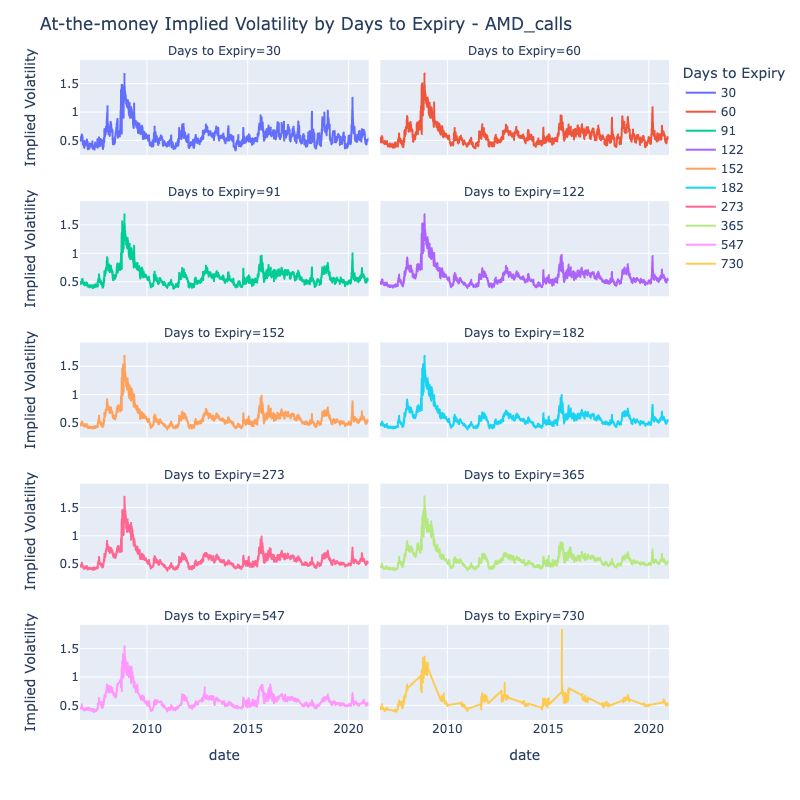

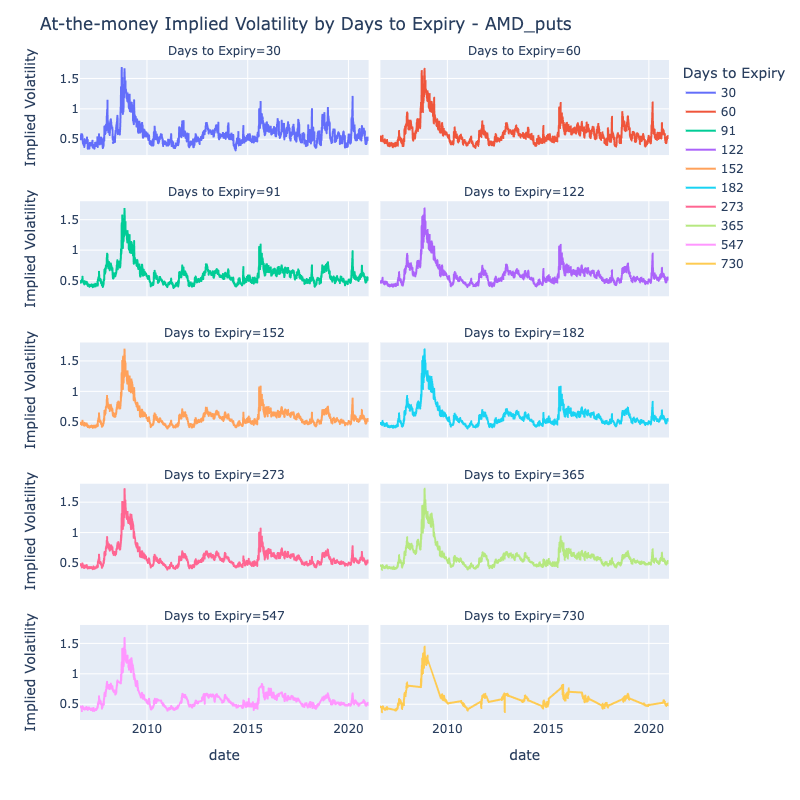

#### 3.2 Autocorrelation Analysis

#### 3.2.1 Autocorrelation

We inspect the Autocorrelation plots for our entire asset universe to determine degree of autocorrelation

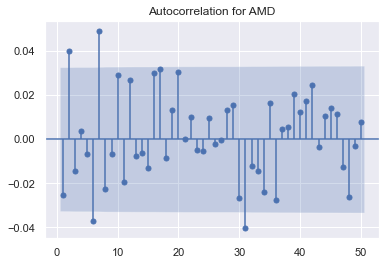

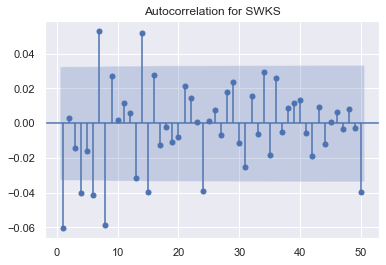

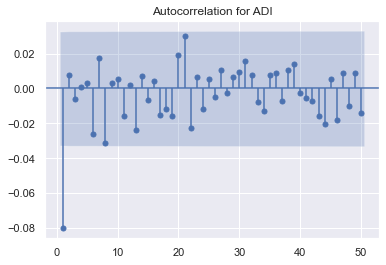

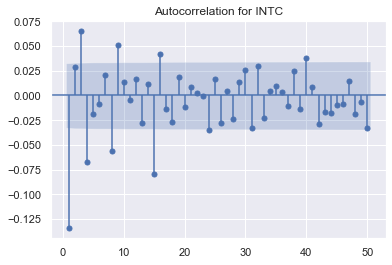

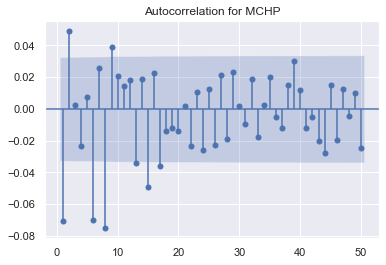

...

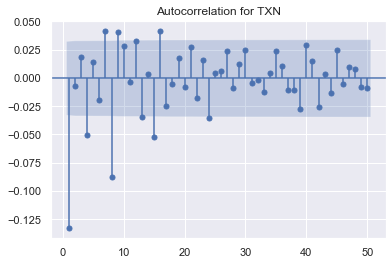

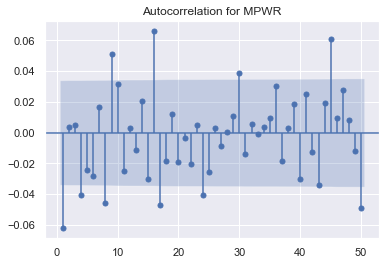

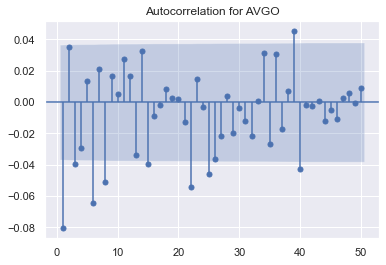

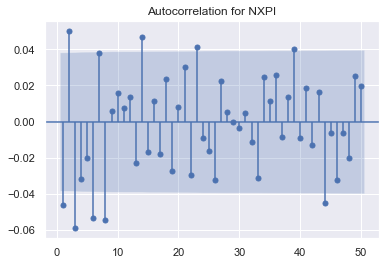

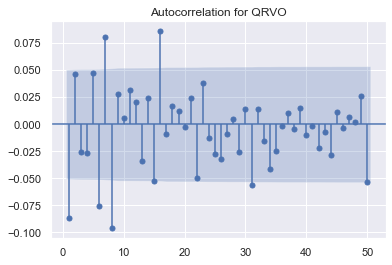

In [97]:
for i, tkr in enumerate(forward_returns.columns):
    x = plot_acf(forward_returns[[f'{tkr}']].dropna(), lags=50, zero = False,
                 title = f'Autocorrelation for {tkr}')
    plt.show()

From empirical analysis of the Autocorrelation, we cannot see significant autocorrelation for a univariate GARCH model for volatility. However, we also look at the partial autocorrelation

#### 3.2.1 Partial Autocorrelation

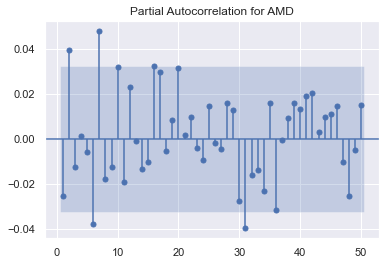

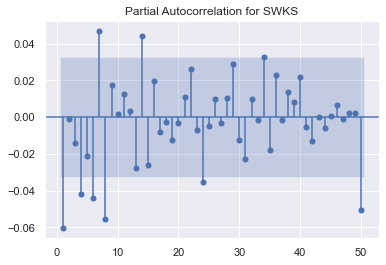

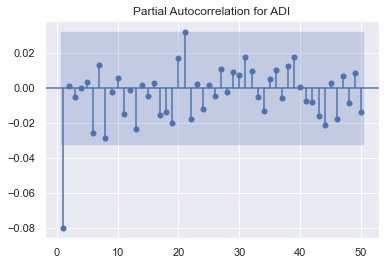

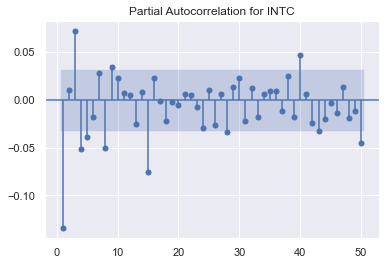

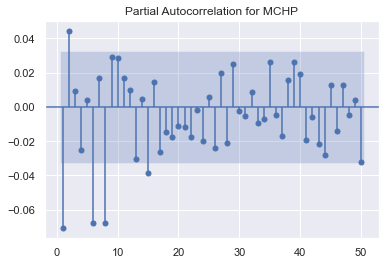

...

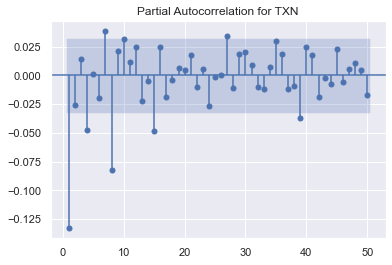

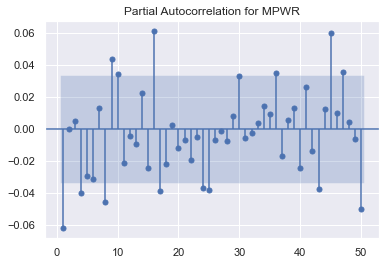

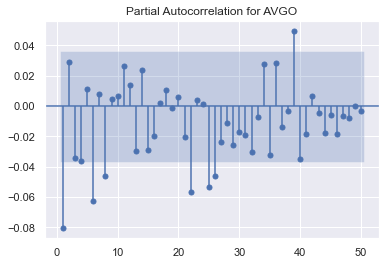

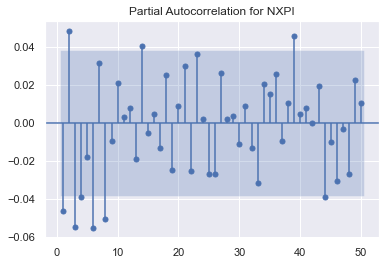

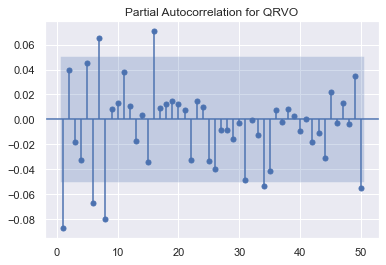

In [70]:
for i, tkr in enumerate(forward_returns.columns):
    x = plot_pacf(forward_returns[[f'{tkr}']].dropna(), lags=50, zero = False,
                 title = f'Partial Autocorrelation for {tkr}')
    plt.show()

From the partial autocorrelation plots, we see that we do not find significant enough autocorrelation for univariate volatility models. We thus move our attention to multivariate realized volatility models.